# Applied Data Science Capstone

## Peer-graded Assignment: Capstone Project - The Battle of Neighborhoods (Week 1)
___

### Introduction/Business Problem
***
*Clearly define a problem or an idea of your choice, where you would need to leverage the Foursquare location data to solve or execute. Remember that data science problems always target an audience and are meant to help a group of stakeholders solve a problem, so make sure that you explicitly describe your audience and why they would care about your problem.*

Lehi in Utah is the one of the fastest growing cities in the United State of America. Lehi's nickname, Sillicon Slope, is an attractive place for companies such as Adobe, Microsoft, and Oracle, which have built campuses. Additionally, new startups are growing rapidly in this area. Lehi is close to Salt Lake City International airport and Sundance - where the Sundance film festival is held every winter. Lehi is also famous for it’s beautiful mountains and forest which attracts hikers and outdoor enthusiasts.

  However, these various advantages and the increasing number of business travelers and tourists in Lehi face one challenge. One of the problems in this area is public transportation. Lehi’s rapid growth has highlighted an extreme need for improved public transportation - that is not as readily available as places like New York or San Francisco. A tourist wanting to visit the various sites around Lehi would find it difficult to hail a taxi or find a bus to reach their destination. Luckily, we have car sharing systems like Uber and Lyft, and we can also explore the area by utilizing the information from Google map or FourSquare before traveling. 

  As a travel agency manager, I am going to present this report to one of my clients who is going to visit Lehi for a tech conference in October. This client has never visited Lehi before and plans to stay 3 days. She is participating in the conference on the first day of the trip, and has already booked the hotel - Hyatt Place in Lehi. During her business trip, she wants to go hiking in the mountains or trails to experience the natural fall landscape. She is also planning to go shopping to get souvenirs for her friends and family. I was given the draft planner and charging on completing the planner. In order for her to have a successful business trip, I need to make a plan for the second and third day. 

### Data
---

*Describe the data that you will be using to solve the problem or execute your idea. Remember that you will need to use the Foursquare location data to solve the problem or execute your idea. You can absolutely use other datasets in combination with the Foursquare location data. So make sure that you provide adequate explanation and discussion, with examples, of the data that you will be using, even if it is only Foursquare location data.*

1. I have researched Google to outline my plan, and was able to reach [this website](https://www.tripadvisor.com/Attractions-g57044-Activities-Lehi_Utah.html):
This website provides general information specially top attractions that visitors can do in Lehi. 
 
 
2.  I am going to add climate data in Lehi which can help her pack her luggage: As per [Wikipedia data](https://en.wikipedia.org/wiki/Lehi,_Utah), I am going to create a climate data in October. This data will provide some tips like what clothes she needs to prepare. 


3. Using FourSquare’s API, I am going to make a map for recommendation [restaurant](https://foursquare.com/explore?mode=url&near=Lehi%2C%20UT%2C%20United%20States&nearGeoId=72057594043705160&q=Restaurant), [shopping areas](https://foursquare.com/explore?mode=url&near=Lehi%2C%20UT%2C%20United%20States&nearGeoId=72057594043705160&q=shopping) near the Hotels and [hiking places](https://foursquare.com/explore?mode=url&near=Lehi%2C%20UT%2C%20United%20States&nearGeoId=72057594043705160&q=hiking)


4. I am also going to include other placese where the client may consider to go like [museums or exhibition.](https://foursquare.com/explore?mode=url&ne=40.436169%2C-111.817088&q=museum&sw=40.381663%2C-111.902833)

___


#### Before getting the data and analyzing it, I imported the libraries will need for the project first.

In [1]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import numpy as np # library to handle data in a vectorized manner

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

from geopy.geocoders import Nominatim # library to convert an address into latitude and longitude values

# libraries for displaying images
from IPython.display import Image, display
from IPython.core.display import HTML
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

import folium # plotting library

#Importing images from the websites
from PIL import Image
import requests


print('Libraries imported.')

Libraries imported.


### Methodology
---

#### 1. I am given a draft planner by my client, need to find a plan, and update the NaN sections.

In [2]:
draft_planner = pd.DataFrame(index=['Morning','Evening','Night'],columns=['Day1','Day2','Day3'])
draft_planner.iloc[0,0] = 'Arriving at Salt Lake City Airport and heading to the hotel'
draft_planner.iloc[1,0] = 'Participating IT conference'
draft_planner.iloc[2,0] = 'Return to the hotel and find a restraunt for dinner'
draft_planner.iloc[2,2] = 'Heading to the airport'
draft_planner

,Day1,Day2,Day3
Morning,Arriving at Salt Lake City Airport and heading...,NaN,NaN
Evening,Participating IT conference,NaN,NaN
Night,Return to the hotel and find a restraunt for d...,NaN,Heading to the airport


___
#### 2. I researched the weather data in Wikipedia and organized it to data frame.

In [3]:
dfs = pd.read_html('https://en.wikipedia.org/wiki/Lehi,_Utah')
len(dfs) #10 of dataframes are available.

climate = dfs[2]
climate.drop(climate.index[3], inplace=True)
climate

Climate data for Lehi, Utah                                      \
                               Month         Jan         Feb         Mar   
0               Average high °F (°C)       37(3)       43(6)      52(11)   
1                Average low °F (°C)      16(−9)      19(−7)      28(−2)   
2  Average precipitation inches (mm)  0.98(24.9)  1.00(25.4)  1.12(28.4)   

                                                                     \
       Apr         May         Jun      Jul         Aug         Sep   
0   61(16)      72(22)      82(28)   90(32)      88(31)      79(26)   
1    34(1)       41(5)       48(9)   55(13)      54(12)       45(7)   
2  1.3(33)  1.40(35.6)  0.66(16.8)  0.7(17)  0.98(24.9)  1.15(29.2)   

                                                     
          Oct         Nov         Dec          Year  
0      64(18)       48(9)       39(4)        63(17)  
1       34(1)      25(−4)      18(−8)         35(2)  
2  1.33(33.8)  1.13(28.7)  0.69(17.5)  12.44(315.2)

In [4]:
df_oct= climate['Climate data for Lehi, Utah',   'Oct']
df_oct 

0        64(18)
1         34(1)
2    1.33(33.8)
Name: (Climate data for Lehi, Utah, Oct), dtype: object

In [5]:
climate_oct =df_oct.to_frame()
climate_oct

,"Climate data for Lehi, Utah"
,Oct
0,64(18)
1,34(1)
2,1.33(33.8)


In [6]:
climate_oct.rename({0:'Average high °F (°C)', 1: 'Average low °F (°C)',2:'Average precipitation inches (mm)'}, axis='index', inplace=True)
climate_oct.rename({'Oct':'October'}, axis=1,inplace=True)
climate_oct

,"Climate data for Lehi, Utah"
,October
Average high °F (°C),64(18)
Average low °F (°C),34(1)
Average precipitation inches (mm),1.33(33.8)


Based on data, the client can expect comfortable autumn weather in Lehi. However,she may need to pack a winter jacket because the temperture could get dropped as below as 34°F.
___

#### 3.  I used the [first data source](https://www.tripadvisor.com/Attractions-g57044-Activities-Lehi_Utah.html) to find general traveling knowledge of Lehi, UT and organized the location data by the client's preference to data frame.

In [7]:
trip_lehi = pd.DataFrame({'Name of the place': ['Thanks Giving Point','Museum of Natural Curiosity', 'Museum of Ancient Life','Outlets at Traverse Mountain','Ashton Gardens','Hutchings Museum',"Cornbelly's Corn Maze & Pumpkin Fest",'Glass Art Institute at Thanksgiving Point','Lehi Roller Mills','Butterfly Biosphere','Pointe Meadow Park'],
                          'Category': ['Specialty Museums',"Children's Museums",'Natural History Museums','Factory Outlets','Scenic Walking Areas','Museum','Farms','Art Galleries','Historic Sites','Science Museums','Parks'],
                         'Hours':['Mon - Sat 10:00 AM - 8:00 PM','Mon - Sat 10:00 AM - 8:00 PM','Mon - Sat 10:00 AM - 8:00 PM','Mon - Sat 10:00 AM - 9:00 PM, Sun 11:00 AM - 6:00 PM','Temporarily closed','Mon - Sat 11:00 AM - 8:30 PM',np.nan,np.nan,np.nan,np.nan,np.nan]})
trip_lehi

,Name of the place,Category,Hours
0,Thanks Giving Point,Specialty Museums,Mon - Sat 10:00 AM - 8:00 PM
1,Museum of Natural Curiosity,Children's Museums,Mon - Sat 10:00 AM - 8:00 PM
2,Museum of Ancient Life,Natural History Museums,Mon - Sat 10:00 AM - 8:00 PM
3,Outlets at Traverse Mountain,Factory Outlets,"Mon - Sat 10:00 AM - 9:00 PM, Sun 11:00 AM - 6..."
4,Ashton Gardens,Scenic Walking Areas,Temporarily closed
5,Hutchings Museum,Museum,Mon - Sat 11:00 AM - 8:30 PM
6,Cornbelly's Corn Maze & Pumpkin Fest,Farms,NaN
7,Glass Art Institute at Thanksgiving Point,Art Galleries,NaN
8,Lehi Roller Mills,Historic Sites,NaN
9,Butterfly Biosphere,Science Museums,NaN


In [8]:
#Remove the rows with NaN in Hours columns.
trip_lehi.dropna(inplace=True)

In [9]:
#Also remove the rows with 'Temporarily closed' in hours columns
trip_lehi.drop(index=4, inplace=True, axis=0)

In [10]:
trip_lehi

,Name of the place,Category,Hours
0,Thanks Giving Point,Specialty Museums,Mon - Sat 10:00 AM - 8:00 PM
1,Museum of Natural Curiosity,Children's Museums,Mon - Sat 10:00 AM - 8:00 PM
2,Museum of Ancient Life,Natural History Museums,Mon - Sat 10:00 AM - 8:00 PM
3,Outlets at Traverse Mountain,Factory Outlets,"Mon - Sat 10:00 AM - 9:00 PM, Sun 11:00 AM - 6..."
5,Hutchings Museum,Museum,Mon - Sat 11:00 AM - 8:30 PM


As per the client's request, I added 'Outlets at Traverse Mountain' to the plan. The museums such as 'Thanks Giving Point', 'Museum of Ancient Life' and 'Hutchings Museum' are the options I could consider. 

#### 4.  In order to get the distances data, I used FourSquare’s API and display the map of the location for visualization purpose. I also include reviews of the location by using FourSqure’s API to give the client options to choose for her trip. 

In [11]:
# Process for FourSquare's API: 
CLIENT_ID = 'L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4' 
CLIENT_SECRET = 'RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY'
VERSION = '20201028'
LIMIT = 30
print('My credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

My credentails:
CLIENT_ID: L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4
CLIENT_SECRET:RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY


As mentioned in introduction, the client is going to stay at the Hyatt Place Lehi. The address of hotel is '3700 North, Outlet Pkwy, Lehi, UT 84043' according to [its website](https://www.hyatt.com/en-US/hotel/utah/hyatt-place-salt-lake-city-lehi/slczt?src=corp_lclb_gmb_seo_nam_slczt). I am going to start by converting the the Hotel's address to its latitude and longitude coordinates.

In [12]:
address = '3700 North, Outlet Pkwy, Lehi, UT'

# geolocator = Nominatim(user_agent="foursquare_agent")
# location = geolocator.geocode(address)
# latitude = location.latitude
# longitude = location.longitude
latitude_hotel=40.4324226379395
longitude_hotel=-111.881546020508

print(latitude_hotel, longitude_hotel)

40.4324226379395 -111.881546020508


##### 4-1. Restraunt Options:

In [13]:
search_query_food = 'Restaurant'
radius = 10000
print(search_query_food + ' .... OK!')
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude_hotel, longitude_hotel, VERSION, search_query_food, radius, LIMIT)
url

Restaurant .... OK!


'https://api.foursquare.com/v2/venues/search?client_id=L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4&client_secret=RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY&ll=40.4324226379395,-111.881546020508&v=20201028&query=Restaurant&radius=10000&limit=30'

In [14]:
results_food = requests.get(url).json()
results_food

{'meta': {'code': 200, 'requestId': '5fa088c2ad784013dff38c7b'},
 'response': {'venues': [{'id': '4b9e7701f964a52037e636e3',
    'name': 'Harvest Restaurant',
    'location': {'address': '3003 N Thanksgiving Way',
     'lat': 40.42591376009597,
     'lng': -111.88710811989087,
     'labeledLatLngs': [{'label': 'display',
       'lat': 40.42591376009597,
       'lng': -111.88710811989087},
      {'label': 'entrance', 'lat': 40.426316, 'lng': -111.887335}],
     'distance': 864,
     'postalCode': '84043',
     'cc': 'US',
     'city': 'Lehi',
     'state': 'UT',
     'country': 'United States',
     'formattedAddress': ['3003 N Thanksgiving Way',
      'Lehi, UT 84043',
      'United States']},
    'categories': [{'id': '4bf58dd8d48988d157941735',
      'name': 'New American Restaurant',
      'pluralName': 'New American Restaurants',
      'shortName': 'New American',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/newamerican_',
       'suffix': '.png'},
      'p

In [15]:
# assign relevant part of JSON to venues_food
venues_food = results_food['response']['venues']

# tranform venues into a dataframe_food
dataframe_food = pd.json_normalize(venues_food)
dataframe_food

,id,name,categories,referralId,hasPerk,location.address,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,location.crossStreet,venuePage.id,delivery.id,delivery.url,delivery.provider.name,delivery.provider.icon.prefix,delivery.provider.icon.sizes,delivery.provider.icon.name
0,4b9e7701f964a52037e636e3,Harvest Restaurant,"[{'id': '4bf58dd8d48988d157941735', 'name': 'N...",v-1604356291,False,3003 N Thanksgiving Way,40.425914,-111.887108,"[{'label': 'display', 'lat': 40.42591376009597...",864,84043,US,Lehi,UT,United States,"[3003 N Thanksgiving Way, Lehi, UT 84043, Unit...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,57c38bd4498e726a0aa53f59,Tsunami Restaurant & Sushi Bar,"[{'id': '4bf58dd8d48988d1d2941735', 'name': 'S...",v-1604356291,False,1616 W Traverse Pkwy,40.432669,-111.875990,"[{'label': 'display', 'lat': 40.43266888450752...",471,84043,US,Lehi,UT,United States,"[1616 W Traverse Pkwy, Lehi, UT 84043, United ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4cc2467eb2beb1f7b1150f4c,La Fuente Restaurant,"[{'id': '4bf58dd8d48988d1c1941735', 'name': 'M...",v-1604356291,False,101 N 1200 E #A6,40.389476,-111.827382,"[{'label': 'display', 'lat': 40.38947575958743...",6628,84043,US,Lehi,UT,United States,"[101 N 1200 E #A6, Lehi, UT 84043, United States]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4b5e799af964a5202e9029e3,Jim's Family Restaurant,"[{'id': '4bf58dd8d48988d14e941735', 'name': 'A...",v-1604356291,False,834 E State Rd,40.371173,-111.775524,"[{'label': 'display', 'lat': 40.37117345531693...",11281,84003,US,American Fork,UT,United States,"[834 E State Rd, American Fork, UT 84003, Unit...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4c9cee567c096dcbc33ec6d1,Jim's Family Restaurant,"[{'id': '4bf58dd8d48988d14e941735', 'name': 'A...",v-1604356291,False,1728 W Park Ave,40.519226,-111.939243,"[{'label': 'display', 'lat': 40.51922600067426...",10827,84065,US,Riverton,UT,United States,"[1728 W Park Ave (at S Redwood Rd), Riverton, ...",at S Redwood Rd,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,4e4de704bd4101d0d79dc61a,A&W Restaurant,"[{'id': '4bf58dd8d48988d16e941735', 'name': 'F...",v-1604356291,False,439 E State St,40.374035,-111.786482,"[{'label': 'display', 'lat': 40.37403492111159...",10353,84003,US,American Fork,UT,United States,"[439 E State St, American Fork, UT 84003, Unit...",NaN,582837970,NaN,NaN,NaN,NaN,NaN,NaN
6,4e4de705bd4101d0d79dc630,A&W Restaurant,"[{'id': '4bf58dd8d48988d16e941735', 'name': 'F...",v-1604356291,False,674 E 12300 S,40.526531,-111.872257,"[{'label': 'display', 'lat': 40.526531, 'lng':...",10505,84020,US,Draper,UT,United States,"[674 E 12300 S, Draper, UT 84020, United States]",NaN,583837407,NaN,NaN,NaN,NaN,NaN,NaN
7,4f43ec9519836ed0019142da,A&W Restaurant,"[{'id': '4bf58dd8d48988d16e941735', 'name': 'F...",v-1604356291,False,1827 W 12600 S,40.520950,-111.940086,"[{'label': 'display', 'lat': 40.52095, 'lng': ...",11031,84065,US,Riverton,UT,United States,"[1827 W 12600 S, Riverton, UT 84065, United St...",NaN,587835540,NaN,NaN,NaN,NaN,NaN,NaN
8,4f3236ca19836c91c7c161ca,Corenas Restaurant,"[{'id': '4d4b7105d754a06374d81259', 'name': 'F...",v-1604356291,False,288 W Main St,40.388008,-111.853455,"[{'label': 'entrance', 'lat': 40.387927, 'lng'...",5487,84043,US,Lehi,UT,United States,"[288 W Main St, Lehi, UT 84043, United States]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,51bb7d967dd2f04dd823b0a0,Temptasian Restaurant,"[{'id': '4bf58dd8d48988d142941735', 'name': 'A...",v-1604356291,False,987 W 500 N,40.388552,-111.824083,"[{'label': 'display', 'lat': 40.38855213843044...",6897,84003,US,American Fork,UT,United States,"[987 W 500 N, American Fork, UT 84003, United ...",NaN,NaN,1322729,https://www.grubhub.com/restaurant/temptasian-...,grubhub,https://fastly.4sqi.net/img/general/cap/,"[40, 50]",/delivery_provider_grubhub_20180129.png


In [16]:
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in dataframe_food.columns if col.startswith('location.')] + ['id']
dataframe_food_filtered = dataframe_food.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue_food.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_food_filtered['categories'] = dataframe_food_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_food_filtered.columns = [column.split('.')[-1] for column in dataframe_food_filtered.columns]

dataframe_food_filtered

,name,categories,address,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,crossStreet,id
0,Harvest Restaurant,New American Restaurant,3003 N Thanksgiving Way,40.425914,-111.887108,"[{'label': 'display', 'lat': 40.42591376009597...",864,84043,US,Lehi,UT,United States,"[3003 N Thanksgiving Way, Lehi, UT 84043, Unit...",NaN,4b9e7701f964a52037e636e3
1,Tsunami Restaurant & Sushi Bar,Sushi Restaurant,1616 W Traverse Pkwy,40.432669,-111.875990,"[{'label': 'display', 'lat': 40.43266888450752...",471,84043,US,Lehi,UT,United States,"[1616 W Traverse Pkwy, Lehi, UT 84043, United ...",NaN,57c38bd4498e726a0aa53f59
2,La Fuente Restaurant,Mexican Restaurant,101 N 1200 E #A6,40.389476,-111.827382,"[{'label': 'display', 'lat': 40.38947575958743...",6628,84043,US,Lehi,UT,United States,"[101 N 1200 E #A6, Lehi, UT 84043, United States]",NaN,4cc2467eb2beb1f7b1150f4c
3,Jim's Family Restaurant,American Restaurant,834 E State Rd,40.371173,-111.775524,"[{'label': 'display', 'lat': 40.37117345531693...",11281,84003,US,American Fork,UT,United States,"[834 E State Rd, American Fork, UT 84003, Unit...",NaN,4b5e799af964a5202e9029e3
4,Jim's Family Restaurant,American Restaurant,1728 W Park Ave,40.519226,-111.939243,"[{'label': 'display', 'lat': 40.51922600067426...",10827,84065,US,Riverton,UT,United States,"[1728 W Park Ave (at S Redwood Rd), Riverton, ...",at S Redwood Rd,4c9cee567c096dcbc33ec6d1
5,A&W Restaurant,Fast Food Restaurant,439 E State St,40.374035,-111.786482,"[{'label': 'display', 'lat': 40.37403492111159...",10353,84003,US,American Fork,UT,United States,"[439 E State St, American Fork, UT 84003, Unit...",NaN,4e4de704bd4101d0d79dc61a
6,A&W Restaurant,Fast Food Restaurant,674 E 12300 S,40.526531,-111.872257,"[{'label': 'display', 'lat': 40.526531, 'lng':...",10505,84020,US,Draper,UT,United States,"[674 E 12300 S, Draper, UT 84020, United States]",NaN,4e4de705bd4101d0d79dc630
7,A&W Restaurant,Fast Food Restaurant,1827 W 12600 S,40.520950,-111.940086,"[{'label': 'display', 'lat': 40.52095, 'lng': ...",11031,84065,US,Riverton,UT,United States,"[1827 W 12600 S, Riverton, UT 84065, United St...",NaN,4f43ec9519836ed0019142da
8,Corenas Restaurant,Food,288 W Main St,40.388008,-111.853455,"[{'label': 'entrance', 'lat': 40.387927, 'lng'...",5487,84043,US,Lehi,UT,United States,"[288 W Main St, Lehi, UT 84043, United States]",NaN,4f3236ca19836c91c7c161ca
9,Temptasian Restaurant,Asian Restaurant,987 W 500 N,40.388552,-111.824083,"[{'label': 'display', 'lat': 40.38855213843044...",6897,84003,US,American Fork,UT,United States,"[987 W 500 N, American Fork, UT 84003, United ...",NaN,51bb7d967dd2f04dd823b0a0


In [17]:
# Removed unnecessary data and sorted the data by distance.
dataframe_food_filtered.drop(columns=['postalCode','cc','country'], inplace=True)
dataframe_food_filtered.sort_values(by='distance',axis=0, ascending=True)
dataframe_food_filtered

,name,categories,address,lat,lng,labeledLatLngs,distance,city,state,formattedAddress,crossStreet,id
0,Harvest Restaurant,New American Restaurant,3003 N Thanksgiving Way,40.425914,-111.887108,"[{'label': 'display', 'lat': 40.42591376009597...",864,Lehi,UT,"[3003 N Thanksgiving Way, Lehi, UT 84043, Unit...",NaN,4b9e7701f964a52037e636e3
1,Tsunami Restaurant & Sushi Bar,Sushi Restaurant,1616 W Traverse Pkwy,40.432669,-111.875990,"[{'label': 'display', 'lat': 40.43266888450752...",471,Lehi,UT,"[1616 W Traverse Pkwy, Lehi, UT 84043, United ...",NaN,57c38bd4498e726a0aa53f59
2,La Fuente Restaurant,Mexican Restaurant,101 N 1200 E #A6,40.389476,-111.827382,"[{'label': 'display', 'lat': 40.38947575958743...",6628,Lehi,UT,"[101 N 1200 E #A6, Lehi, UT 84043, United States]",NaN,4cc2467eb2beb1f7b1150f4c
3,Jim's Family Restaurant,American Restaurant,834 E State Rd,40.371173,-111.775524,"[{'label': 'display', 'lat': 40.37117345531693...",11281,American Fork,UT,"[834 E State Rd, American Fork, UT 84003, Unit...",NaN,4b5e799af964a5202e9029e3
4,Jim's Family Restaurant,American Restaurant,1728 W Park Ave,40.519226,-111.939243,"[{'label': 'display', 'lat': 40.51922600067426...",10827,Riverton,UT,"[1728 W Park Ave (at S Redwood Rd), Riverton, ...",at S Redwood Rd,4c9cee567c096dcbc33ec6d1
5,A&W Restaurant,Fast Food Restaurant,439 E State St,40.374035,-111.786482,"[{'label': 'display', 'lat': 40.37403492111159...",10353,American Fork,UT,"[439 E State St, American Fork, UT 84003, Unit...",NaN,4e4de704bd4101d0d79dc61a
6,A&W Restaurant,Fast Food Restaurant,674 E 12300 S,40.526531,-111.872257,"[{'label': 'display', 'lat': 40.526531, 'lng':...",10505,Draper,UT,"[674 E 12300 S, Draper, UT 84020, United States]",NaN,4e4de705bd4101d0d79dc630
7,A&W Restaurant,Fast Food Restaurant,1827 W 12600 S,40.520950,-111.940086,"[{'label': 'display', 'lat': 40.52095, 'lng': ...",11031,Riverton,UT,"[1827 W 12600 S, Riverton, UT 84065, United St...",NaN,4f43ec9519836ed0019142da
8,Corenas Restaurant,Food,288 W Main St,40.388008,-111.853455,"[{'label': 'entrance', 'lat': 40.387927, 'lng'...",5487,Lehi,UT,"[288 W Main St, Lehi, UT 84043, United States]",NaN,4f3236ca19836c91c7c161ca
9,Temptasian Restaurant,Asian Restaurant,987 W 500 N,40.388552,-111.824083,"[{'label': 'display', 'lat': 40.38855213843044...",6897,American Fork,UT,"[987 W 500 N, American Fork, UT 84003, United ...",NaN,51bb7d967dd2f04dd823b0a0


In [18]:
# Visualized the map: 

venues_food_map = folium.Map(location=[latitude_hotel, longitude_hotel], zoom_start=12) # generated map centred around Hyatt Place

# added a red circle marker to represent Hyatt Place
folium.CircleMarker(
    [latitude_hotel, longitude_hotel],
    radius=10,
    color='red',
    popup='Hyatt Place',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(venues_food_map)

# added the restaurants as blue circle markers
for lat, lng, label in zip(dataframe_food_filtered.lat, dataframe_food_filtered.lng, dataframe_food_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_food_map)

# display map
venues_food_map

Two restraunts near the hotel returned. One is sushi restaurant and New American Restaurant. I looked the the reviews to find better option.

#### 4-1-a. Tsunami Restaurant & Sushi Bar

In [19]:
venue_id = '57c38bd4498e726a0aa53f59' # ID of Tsunami Restaurant
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
url

'https://api.foursquare.com/v2/venues/57c38bd4498e726a0aa53f59?client_id=L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4&client_secret=RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY&v=20201028'

In [20]:
result_sushi = requests.get(url).json()
print(result_sushi['response']['venue'].keys())
result_sushi['response']['venue']

dict_keys(['id', 'name', 'contact', 'location', 'canonicalUrl', 'categories', 'verified', 'stats', 'price', 'hasMenu', 'likes', 'dislike', 'ok', 'rating', 'ratingColor', 'ratingSignals', 'menu', 'allowMenuUrlEdit', 'beenHere', 'specials', 'photos', 'reasons', 'hereNow', 'createdAt', 'tips', 'shortUrl', 'timeZone', 'listed', 'hours', 'popular', 'seasonalHours', 'defaultHours', 'pageUpdates', 'inbox', 'attributes', 'bestPhoto', 'colors'])


{'id': '57c38bd4498e726a0aa53f59',
 'name': 'Tsunami Restaurant & Sushi Bar',
 'contact': {'phone': '8017700088', 'formattedPhone': '(801) 770-0088'},
 'location': {'address': '1616 W Traverse Pkwy',
  'lat': 40.43266888450752,
  'lng': -111.87599013825452,
  'labeledLatLngs': [{'label': 'display',
    'lat': 40.43266888450752,
    'lng': -111.87599013825452}],
  'postalCode': '84043',
  'cc': 'US',
  'city': 'Lehi',
  'state': 'UT',
  'country': 'United States',
  'formattedAddress': ['1616 W Traverse Pkwy',
   'Lehi, UT 84043',
   'United States']},
 'canonicalUrl': 'https://foursquare.com/v/tsunami-restaurant--sushi-bar/57c38bd4498e726a0aa53f59',
 'categories': [{'id': '4bf58dd8d48988d1d2941735',
   'name': 'Sushi Restaurant',
   'pluralName': 'Sushi Restaurants',
   'shortName': 'Sushi',
   'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/sushi_',
    'suffix': '.png'},
   'primary': True}],
 'verified': False,
 'stats': {'tipCount': 7},
 'price': {'tier': 2, 'messag

In [21]:
# Overall Rating
try:
    print('The rating is', result_sushi['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

The rating is 8.3


In [22]:
# Reviews
result_sushi['response']['venue']['tips']['count']
limit = 15
url = 'https://api.foursquare.com/v2/venues/57c38bd4498e726a0aa53f59/tips?client_id={}&client_secret={}&v={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, limit)

results_tip_sushi = requests.get(url).json()
results_tip_sushi

{'meta': {'code': 200, 'requestId': '5fa088c49d7cfa6c1b7891fd'},
 'response': {'tips': {'count': 7,
   'items': [{'id': '58e2b9241d21ba36f262bfa0',
     'createdAt': 1491253540,
     'text': 'nice.. they have many variant of sushi',
     'type': 'user',
     'canonicalUrl': 'https://foursquare.com/item/58e2b9241d21ba36f262bfa0',
     'photo': {'id': '58e2b928f857240973031ea8',
      'createdAt': 1491253544,
      'source': {'name': 'Foursquare for iOS',
       'url': 'https://foursquare.com/download/#/iphone'},
      'prefix': 'https://fastly.4sqi.net/img/general/',
      'suffix': '/5030073_oqTFXjS8-1-bahKCaboJadnEaXHmu3Z-BdWsBicitN4.jpg',
      'width': 1440,
      'height': 1920,
      'visibility': 'public'},
     'photourl': 'https://fastly.4sqi.net/img/general/original/5030073_oqTFXjS8-1-bahKCaboJadnEaXHmu3Z-BdWsBicitN4.jpg',
     'lang': 'en',
     'likes': {'count': 0, 'groups': []},
     'logView': True,
     'agreeCount': 2,
     'disagreeCount': 0,
     'todo': {'count': 0},

In [23]:
tips = results_tip_sushi['response']['tips']['items']
tip = results_tip_sushi['response']['tips']['items'][0]
tip.keys()

dict_keys(['id', 'createdAt', 'text', 'type', 'canonicalUrl', 'photo', 'photourl', 'lang', 'likes', 'logView', 'agreeCount', 'disagreeCount', 'todo', 'user'])

In [24]:
pd.set_option('display.max_colwidth',None)

tips_df = pd.json_normalize(tips) # json normalize tips

# columns to keep
filtered_columns = ['text', 'agreeCount', 'disagreeCount', 'id', 'user.firstName', 'user.lastName', 'user.id']
tips_filtered = tips_df.loc[:, filtered_columns]

# display tips
tips_filtered.reindex()

,text,agreeCount,disagreeCount,id,user.firstName,user.lastName,user.id
0,nice.. they have many variant of sushi,2,0,58e2b9241d21ba36f262bfa0,Fathia,A,5030073


Based on the distance, rating, and review, I decided to add the sushi restaurant to the plan.
___

#### 4-1-b. Harvest Restaurant

In [25]:
venue_id = '4b9e7701f964a52037e636e3' # ID of Harvest Restaurant
url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
result_harvest = requests.get(url).json()
print(result_harvest['response']['venue'].keys())
result_harvest['response']['venue']

dict_keys(['id', 'name', 'contact', 'location', 'canonicalUrl', 'categories', 'verified', 'stats', 'url', 'price', 'hasMenu', 'likes', 'dislike', 'ok', 'rating', 'ratingColor', 'ratingSignals', 'menu', 'allowMenuUrlEdit', 'beenHere', 'specials', 'photos', 'reasons', 'description', 'hereNow', 'createdAt', 'tips', 'shortUrl', 'timeZone', 'listed', 'popular', 'seasonalHours', 'pageUpdates', 'inbox', 'attributes', 'bestPhoto', 'colors'])


{'id': '4b9e7701f964a52037e636e3',
 'name': 'Harvest Restaurant',
 'contact': {'phone': '8017684990',
  'formattedPhone': '(801) 768-4990',
  'twitter': 'thankspoint'},
 'location': {'address': '3003 N Thanksgiving Way',
  'lat': 40.42591376009597,
  'lng': -111.88710811989087,
  'labeledLatLngs': [{'label': 'display',
    'lat': 40.42591376009597,
    'lng': -111.88710811989087},
   {'label': 'entrance', 'lat': 40.426316, 'lng': -111.887335}],
  'postalCode': '84043',
  'cc': 'US',
  'city': 'Lehi',
  'state': 'UT',
  'country': 'United States',
  'formattedAddress': ['3003 N Thanksgiving Way',
   'Lehi, UT 84043',
   'United States']},
 'canonicalUrl': 'https://foursquare.com/v/harvest-restaurant/4b9e7701f964a52037e636e3',
 'categories': [{'id': '4bf58dd8d48988d157941735',
   'name': 'New American Restaurant',
   'pluralName': 'New American Restaurants',
   'shortName': 'New American',
   'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/newamerican_',
    'suffix': '.p

In [26]:
# Rating: 
try:
    print('The rating is', result_harvest['response']['venue']['rating'])
except:
    print('This venue has not been rated yet.')

The rating is 6.9


In [27]:
# Reviews: 
result_harvest['response']['venue']['tips']['count']
limit = 15 
url = 'https://api.foursquare.com/v2/venues/4b9e7701f964a52037e636e3/tips?client_id={}&client_secret={}&v={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, limit)

results_tip_harvest = requests.get(url).json()
results_tip_harvest

{'meta': {'code': 200, 'requestId': '5fa088c490fd6244ff7407b9'},
 'response': {'tips': {'count': 13,
   'items': [{'id': '562cd43b498e18acffd9aa7e',
     'createdAt': 1445778491,
     'text': 'Service was impeccable. I had the pork porterhouse.  Cooked to perfection with amazing sauce.  Aly had the salmon.  Crispy on the outside and melted like butter in the mouth.  Both served searing hot!',
     'type': 'user',
     'canonicalUrl': 'https://foursquare.com/item/562cd43b498e18acffd9aa7e',
     'lang': 'en',
     'likes': {'count': 1,
      'groups': [{'type': 'others', 'count': 1, 'items': []}],
      'summary': '1 like'},
     'logView': True,
     'agreeCount': 2,
     'disagreeCount': 0,
     'todo': {'count': 0},
     'user': {'id': '142323949',
      'isSanctioned': False,
      'firstName': 'Darrin',
      'lastName': 'A',
      'photo': {'prefix': 'https://fastly.4sqi.net/img/user/',
       'suffix': '/142323949-OGF0BQW2HPPJOKLV.jpg'}},
     'authorInteractionType': 'liked'}]}}}

In [28]:
tips = results_tip_harvest['response']['tips']['items']
tip = results_tip_harvest['response']['tips']['items'][0]
tip.keys()

dict_keys(['id', 'createdAt', 'text', 'type', 'canonicalUrl', 'lang', 'likes', 'logView', 'agreeCount', 'disagreeCount', 'todo', 'user', 'authorInteractionType'])

In [29]:
pd.set_option('display.max_colwidth',None)

tips_df_harvest = pd.json_normalize(tips) # json normalize tips

# columns to keep
filtered_columns = ['text', 'agreeCount', 'disagreeCount', 'id', 'user.firstName', 'user.lastName', 'user.id']
tips_filtered_harvest = tips_df_harvest.loc[:, filtered_columns]

# display tips
tips_filtered_harvest.reindex()

,text,agreeCount,disagreeCount,id,user.firstName,user.lastName,user.id
0,Service was impeccable. I had the pork porterhouse. Cooked to perfection with amazing sauce. Aly had the salmon. Crispy on the outside and melted like butter in the mouth. Both served searing hot!,2,0,562cd43b498e18acffd9aa7e,Darrin,A,142323949


Although the rating is lower than sushi restaurant, the review is not bad. I decided to add this restaurant for option.
___

#### 4-1-c. I explored around the sushi restaurant to find out more restaurant options for the client.

In [30]:
# location of Tsunami Restaurant & Sushi Bar:
dataframe_food_filtered.loc[1,['lat','lng']] 

lat    40.4327
lng   -111.876
Name: 1, dtype: object

In [31]:
latitude_sushi = 40.4327
longitude_sushi = -111.876
url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude_sushi, longitude_sushi, VERSION, radius, LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?client_id=L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4&client_secret=RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY&ll=40.4327,-111.876&v=20201028&radius=10000&limit=30'

In [32]:
import requests
results_what_to_do_sushi = requests.get(url).json()
'There are {} around Sushi restaurant.'.format(len(results_what_to_do_sushi['response']['groups'][0]['items']))

'There are 30 around Sushi restaurant.'

In [33]:
# Get relevant part of JSON
items = results_what_to_do_sushi['response']['groups'][0]['items']
items[0]

{'reasons': {'count': 0,
  'items': [{'summary': 'This spot is popular',
    'type': 'general',
    'reasonName': 'globalInteractionReason'}]},
 'venue': {'id': '571511ba498e153edf795c05',
  'name': 'Harmons Grocery',
  'location': {'address': '3450 N Triumph Blvd',
   'lat': 40.43340686612135,
   'lng': -111.87848384934372,
   'labeledLatLngs': [{'label': 'display',
     'lat': 40.43340686612135,
     'lng': -111.87848384934372}],
   'distance': 224,
   'postalCode': '84043',
   'cc': 'US',
   'city': 'Lehi',
   'state': 'UT',
   'country': 'United States',
   'formattedAddress': ['3450 N Triumph Blvd',
    'Lehi, UT 84043',
    'United States']},
  'categories': [{'id': '4bf58dd8d48988d118951735',
    'name': 'Grocery Store',
    'pluralName': 'Grocery Stores',
    'shortName': 'Grocery Store',
    'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_',
     'suffix': '.png'},
    'primary': True}],
  'photos': {'count': 0, 'groups': []}},
 'referralId': 'e-0

In [34]:
df_what_to_do_sushi = pd.json_normalize(items) # flatten JSON
filtered_columns = ['venue.name', 'venue.categories'] + [col for col in df_what_to_do_sushi.columns if col.startswith('venue.location.')] + ['venue.id']
df_what_to_do_sushi_filtered = df_what_to_do_sushi.loc[:, filtered_columns]
df_what_to_do_sushi_filtered.columns = [col.split('.')[-1] for col in df_what_to_do_sushi_filtered.columns]

df_what_to_do_sushi_filtered.head(10)

,name,categories,address,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,crossStreet,id
0,Harmons Grocery,"[{'id': '4bf58dd8d48988d118951735', 'name': 'Grocery Store', 'pluralName': 'Grocery Stores', 'shortName': 'Grocery Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_', 'suffix': '.png'}, 'primary': True}]",3450 N Triumph Blvd,40.433407,-111.878484,"[{'label': 'display', 'lat': 40.43340686612135, 'lng': -111.87848384934372}]",224,84043,US,Lehi,UT,United States,"[3450 N Triumph Blvd, Lehi, UT 84043, United States]",NaN,571511ba498e153edf795c05
1,Tsunami Restaurant & Sushi Bar,"[{'id': '4bf58dd8d48988d1d2941735', 'name': 'Sushi Restaurant', 'pluralName': 'Sushi Restaurants', 'shortName': 'Sushi', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/sushi_', 'suffix': '.png'}, 'primary': True}]",1616 W Traverse Pkwy,40.432669,-111.875990,"[{'label': 'display', 'lat': 40.43266888450752, 'lng': -111.87599013825452}]",3,84043,US,Lehi,UT,United States,"[1616 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,57c38bd4498e726a0aa53f59
2,Megaplex 8,"[{'id': '4bf58dd8d48988d180941735', 'name': 'Multiplex', 'pluralName': 'Multiplexes', 'shortName': 'Cineplex', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/movietheater_', 'suffix': '.png'}, 'primary': True}]",3003 N Thanksgiving Way,40.423772,-111.884988,"[{'label': 'display', 'lat': 40.42377234984366, 'lng': -111.8849884095624}]",1252,84043,US,Lehi,UT,United States,"[3003 N Thanksgiving Way (at Thanksgiving Point), Lehi, UT 84043, United States]",at Thanksgiving Point,4bbe21c7b42aef3b78764bc3
3,J Dawgs,"[{'id': '4bf58dd8d48988d16f941735', 'name': 'Hot Dog Joint', 'pluralName': 'Hot Dog Joints', 'shortName': 'Hot Dogs', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/hotdog_', 'suffix': '.png'}, 'primary': True}]",3750 N Thanksgiving Way Ste B,40.434012,-111.894753,"[{'label': 'display', 'lat': 40.43401191044417, 'lng': -111.89475277171255}]",1595,84043,US,Lehi,UT,United States,"[3750 N Thanksgiving Way Ste B, Lehi, UT 84043, United States]",NaN,5377ab78498eeb0c41739414
4,The Original Pancake House,"[{'id': '4bf58dd8d48988d143941735', 'name': 'Breakfast Spot', 'pluralName': 'Breakfast Spots', 'shortName': 'Breakfast', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/breakfast_', 'suffix': '.png'}, 'primary': True}]",1674 W Traverse Pkwy,40.432462,-111.876887,"[{'label': 'display', 'lat': 40.432462, 'lng': -111.876887}]",79,84043,US,Lehi,UT,United States,"[1674 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,5c81591fdd12f8003907bc34
5,Chick-fil-A,"[{'id': '56aa371be4b08b9a8d573550', 'name': 'Food Service', 'pluralName': 'Food Services', 'shortName': 'Food Service', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/foodanddrink_', 'suffix': '.png'}, 'primary': True}]",3470 N Digital Dr,40.430977,-111.886214,"[{'label': 'display', 'lat': 40.4309768, 'lng': -111.8862139}]",886,84043,US,Lehi,UT,United States,"[3470 N Digital Dr, Lehi, UT 84043, United States]",NaN,59c91fd82d2fd975642620e8
6,Museum of Ancient Life,"[{'id': '4bf58dd8d48988d190941735', 'name': 'History Museum', 'pluralName': 'History Museums', 'shortName': 'History Museum', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_history_', 'suffix': '.png'}, 'primary': True}]",2929 N Thanksgiving Way,40.424669,-111.885937,"[{'label': 'display', 'lat': 40.42466911851144, 'lng': -111.88593655766621}]",1228,84043,US,Lehi,UT,United States,"[2929 N Thanksgiving Way (at Thanksgiving Point), Lehi, UT 84043, United States]",at Thanksgiving Point,4bc74aab14d795218c1467e9
7,Cornbelly's Corn Maze & Pumpkin Fest,"[{'id': '4bf58dd8d48988d1f1931735', 'name': 'General Entertainment', 'pluralName': 'General Entertainment', 'shortName': 'Entertainment', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/default_', 'suffix': '

In [35]:
df_what_to_do_sushi_filtered['categories'] = df_what_to_do_sushi_filtered.apply(get_category_type, axis=1)
df_what_to_do_sushi_filtered

,name,categories,address,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,crossStreet,id
0,Harmons Grocery,Grocery Store,3450 N Triumph Blvd,40.433407,-111.878484,"[{'label': 'display', 'lat': 40.43340686612135, 'lng': -111.87848384934372}]",224,84043,US,Lehi,UT,United States,"[3450 N Triumph Blvd, Lehi, UT 84043, United States]",NaN,571511ba498e153edf795c05
1,Tsunami Restaurant & Sushi Bar,Sushi Restaurant,1616 W Traverse Pkwy,40.432669,-111.875990,"[{'label': 'display', 'lat': 40.43266888450752, 'lng': -111.87599013825452}]",3,84043,US,Lehi,UT,United States,"[1616 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,57c38bd4498e726a0aa53f59
2,Megaplex 8,Multiplex,3003 N Thanksgiving Way,40.423772,-111.884988,"[{'label': 'display', 'lat': 40.42377234984366, 'lng': -111.8849884095624}]",1252,84043,US,Lehi,UT,United States,"[3003 N Thanksgiving Way (at Thanksgiving Point), Lehi, UT 84043, United States]",at Thanksgiving Point,4bbe21c7b42aef3b78764bc3
3,J Dawgs,Hot Dog Joint,3750 N Thanksgiving Way Ste B,40.434012,-111.894753,"[{'label': 'display', 'lat': 40.43401191044417, 'lng': -111.89475277171255}]",1595,84043,US,Lehi,UT,United States,"[3750 N Thanksgiving Way Ste B, Lehi, UT 84043, United States]",NaN,5377ab78498eeb0c41739414
4,The Original Pancake House,Breakfast Spot,1674 W Traverse Pkwy,40.432462,-111.876887,"[{'label': 'display', 'lat': 40.432462, 'lng': -111.876887}]",79,84043,US,Lehi,UT,United States,"[1674 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,5c81591fdd12f8003907bc34
5,Chick-fil-A,Food Service,3470 N Digital Dr,40.430977,-111.886214,"[{'label': 'display', 'lat': 40.4309768, 'lng': -111.8862139}]",886,84043,US,Lehi,UT,United States,"[3470 N Digital Dr, Lehi, UT 84043, United States]",NaN,59c91fd82d2fd975642620e8
6,Museum of Ancient Life,History Museum,2929 N Thanksgiving Way,40.424669,-111.885937,"[{'label': 'display', 'lat': 40.42466911851144, 'lng': -111.88593655766621}]",1228,84043,US,Lehi,UT,United States,"[2929 N Thanksgiving Way (at Thanksgiving Point), Lehi, UT 84043, United States]",at Thanksgiving Point,4bc74aab14d795218c1467e9
7,Cornbelly's Corn Maze & Pumpkin Fest,General Entertainment,3003 N Thanksgiving Way,40.424819,-111.889933,"[{'label': 'display', 'lat': 40.42481904954279, 'lng': -111.8899334219279}]",1470,84043,US,Lehi,UT,United States,"[3003 N Thanksgiving Way (at Thanksgiving Point), Lehi, UT 84043, United States]",at Thanksgiving Point,4ca7673d14c337043439c93b
8,Farm Country,Museum,3003 N Thanksgiving Way,40.424153,-111.888731,"[{'label': 'display', 'lat': 40.424153, 'lng': -111.888731}]",1438,84043,US,Lehi,UT,United States,"[3003 N Thanksgiving Way, Lehi, UT 84043, United States]",NaN,4ad4f28ff964a5205afd20e3
9,Home2 Suites by Hilton,Hotel,3051 W Clubhouse Dr,40.430501,-111.897949,"[{'label': 'display', 'lat': 40.430501303452196, 'lng': -111.8979486823082}]",1875,84043,US,Lehi,UT,United States,"[3051 W Clubhouse Dr, Lehi, UT 84043, United States]",NaN,53de52d3498ea67e4e0b4ee6


In [36]:
# Sorted the places near the sushi restaurant by distance.
df_what_to_do_sushi_filtered.sort_values(by=['distance'], ascending=True, inplace= True)
df_what_to_do_sushi_filtered

,name,categories,address,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,crossStreet,id
1,Tsunami Restaurant & Sushi Bar,Sushi Restaurant,1616 W Traverse Pkwy,40.432669,-111.875990,"[{'label': 'display', 'lat': 40.43266888450752, 'lng': -111.87599013825452}]",3,84043,US,Lehi,UT,United States,"[1616 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,57c38bd4498e726a0aa53f59
4,The Original Pancake House,Breakfast Spot,1674 W Traverse Pkwy,40.432462,-111.876887,"[{'label': 'display', 'lat': 40.432462, 'lng': -111.876887}]",79,84043,US,Lehi,UT,United States,"[1674 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,5c81591fdd12f8003907bc34
0,Harmons Grocery,Grocery Store,3450 N Triumph Blvd,40.433407,-111.878484,"[{'label': 'display', 'lat': 40.43340686612135, 'lng': -111.87848384934372}]",224,84043,US,Lehi,UT,United States,"[3450 N Triumph Blvd, Lehi, UT 84043, United States]",NaN,571511ba498e153edf795c05
19,Cafe Rio Mexican Grill,Mexican Restaurant,1851 W Traverse Parkway Suite D,40.432305,-111.880030,"[{'label': 'display', 'lat': 40.43230458173435, 'lng': -111.88002984952297}]",344,NaN,US,Lehi,UT,United States,"[1851 W Traverse Parkway Suite D, Lehi, UT, United States]",NaN,58054bb538fa04b4a1ec919f
24,Hyatt Place Salt Lake City/Lehi,Hotel,3700 N Outlet Parkway,40.432499,-111.881725,"[{'label': 'display', 'lat': 40.432498996812626, 'lng': -111.88172453970638}, {'label': 'entrance', 'lat': 40.432363, 'lng': -111.881727}]",485,84043,US,Lehi,UT,United States,"[3700 N Outlet Parkway, Lehi, UT 84043, United States]",NaN,569c839f498e3954b72afae8
14,Bona Vita Italian Bistro,Italian Restaurant,"1820 West Traverse Parkway, Suite C",40.434983,-111.882987,"[{'label': 'display', 'lat': 40.43498274457547, 'lng': -111.88298685379614}]",644,84043,US,Lehi,UT,United States,"[1820 West Traverse Parkway, Suite C (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,52b73d68498e8c662c72fc49
25,Nike Factory Store,Sporting Goods Shop,3700 N Cabelas Blvd Ste 301,40.434596,-111.884012,"[{'label': 'display', 'lat': 40.4345955, 'lng': -111.8840122}, {'label': 'entrance', 'lat': 40.43493, 'lng': -111.88289}]",710,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd Ste 301 (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,50b96068e4b0136726d946a8
11,Outlets At Traverse Mountain,Shopping Mall,3700 N Cabelas Blvd,40.434773,-111.884057,"[{'label': 'display', 'lat': 40.43477262880914, 'lng': -111.88405708602524}]",720,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd, Lehi, UT 84043, United States]",NaN,508ea8aae4b07c9fb26ca367
17,Coach Factory Outlet,Accessories Store,3700 N Cabelas Blvd #400,40.435988,-111.884281,"[{'label': 'display', 'lat': 40.435988166050926, 'lng': -111.88428089814758}]",791,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd #400, Lehi, UT 84043, United States]",NaN,50b95d0de4b080f3ffc0dd2c
5,Chick-fil-A,Food Service,3470 N Digital Dr,40.430977,-111.886214,"[{'label': 'display', 'lat': 40.4309768, 'lng': -111.8862139}]",886,84043,US,Lehi,UT,United States,"[3470 N Digital Dr, Lehi, UT 84043, United States]",NaN,59c91fd82d2fd975642620e8


New dataset shows there are more restaurant near the sushi place. For example, there are breakfast place 'The Original Pancake House' and  mexican restaurant 'Cafe Rio Mexican Grill' . I am going to add these places for the options in case the client wants to experience variety food. 

##### 4-2 Shopping Options:

In [37]:
# Finding shopping place near the hotel:
latitude_hotel=40.4324226379395
longitude_hotel=-111.881546020508

search_query_shopping = 'store'
radius = 500
print(search_query_shopping + ' .... OK!')
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude_hotel, longitude_hotel, VERSION, search_query_shopping, radius, LIMIT)
url

store .... OK!


'https://api.foursquare.com/v2/venues/search?client_id=L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4&client_secret=RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY&ll=40.4324226379395,-111.881546020508&v=20201028&query=store&radius=500&limit=30'

In [38]:
results_shopping = requests.get(url).json()
results_shopping

{'meta': {'code': 200, 'requestId': '5fa088c6b84da6719c18bbb5'},
 'response': {'venues': [{'id': '57c73d7f498e1ebef797d3ad',
    'name': 'The UPS Store',
    'location': {'address': '1881 W Traverse Pkwy, Ste E',
     'lat': 40.4334905,
     'lng': -111.8805034,
     'labeledLatLngs': [{'label': 'display',
       'lat': 40.4334905,
       'lng': -111.8805034}],
     'distance': 148,
     'postalCode': '84043',
     'cc': 'US',
     'city': 'Lehi',
     'state': 'UT',
     'country': 'United States',
     'formattedAddress': ['1881 W Traverse Pkwy, Ste E',
      'Lehi, UT 84043',
      'United States']},
    'categories': [{'id': '52f2ab2ebcbc57f1066b8b1f',
      'name': 'Shipping Store',
      'pluralName': 'Shipping Stores',
      'shortName': 'Shipping Store',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/default_',
       'suffix': '.png'},
      'primary': True}],
    'referralId': 'v-1604356294',
    'hasPerk': False},
   {'id': '50b96068e4b0136726d946a8',

In [39]:
# assign relevant part of JSON to venues
venues_shopping = results_shopping['response']['venues']

# tranform venues into a dataframe
dataframe_shopping = pd.json_normalize(venues_shopping)
dataframe_shopping.head()

,id,name,categories,referralId,hasPerk,location.address,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,location.crossStreet
0,57c73d7f498e1ebef797d3ad,The UPS Store,"[{'id': '52f2ab2ebcbc57f1066b8b1f', 'name': 'Shipping Store', 'pluralName': 'Shipping Stores', 'shortName': 'Shipping Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/default_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,"1881 W Traverse Pkwy, Ste E",40.433490,-111.880503,"[{'label': 'display', 'lat': 40.4334905, 'lng': -111.8805034}]",148,84043,US,Lehi,UT,United States,"[1881 W Traverse Pkwy, Ste E, Lehi, UT 84043, United States]",NaN
1,50b96068e4b0136726d946a8,Nike Factory Store,"[{'id': '4bf58dd8d48988d1f2941735', 'name': 'Sporting Goods Shop', 'pluralName': 'Sporting Goods Shops', 'shortName': 'Sporting Goods', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,3700 N Cabelas Blvd Ste 301,40.434596,-111.884012,"[{'label': 'display', 'lat': 40.4345955, 'lng': -111.8840122}, {'label': 'entrance', 'lat': 40.43493, 'lng': -111.88289}]",319,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd Ste 301 (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain
2,50b931f400cad8a2332f7d77,Polo Ralph Lauren Factory Store,"[{'id': '4bf58dd8d48988d103951735', 'name': 'Clothing Store', 'pluralName': 'Clothing Stores', 'shortName': 'Apparel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,3700 N Cabelas Blvd,40.434660,-111.884388,"[{'label': 'display', 'lat': 40.4346596, 'lng': -111.8843884}, {'label': 'entrance', 'lat': 40.43493, 'lng': -111.88289}]",346,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain
3,5b9a5ba4b23dfa002c7c6d77,Columbia Factory Store,"[{'id': '4bf58dd8d48988d103951735', 'name': 'Clothing Store', 'pluralName': 'Clothing Stores', 'shortName': 'Apparel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,3700 North Cabelas Blvd Ste 450,40.435163,-111.884080,"[{'label': 'display', 'lat': 40.4351634, 'lng': -111.8840798}]",373,84043,US,Lehi,UT,United States,"[3700 North Cabelas Blvd Ste 450, Lehi, UT 84043, United States]",NaN
4,50c3a5ece4b0c5b6f417c422,Levi's Outlet Store,"[{'id': '4bf58dd8d48988d103951735', 'name': 'Clothing Store', 'pluralName': 'Clothing Stores', 'shortName': 'Apparel', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/apparel_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,3700 N Cabelas Blvd #405,40.435395,-111.884247,"[{'label': 'display', 'lat': 40.435395, 'lng': -111.884247}]",402,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd #405 (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain


In [40]:
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in dataframe_shopping.columns if col.startswith('location.')] + ['id']
dataframe_shopping_filtered = dataframe_shopping.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_shopping_filtered['categories'] = dataframe_shopping_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_shopping_filtered.columns = [column.split('.')[-1] for column in dataframe_shopping_filtered.columns]

dataframe_shopping_filtered

,name,categories,address,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,crossStreet,id
0,The UPS Store,Shipping Store,"1881 W Traverse Pkwy, Ste E",40.433490,-111.880503,"[{'label': 'display', 'lat': 40.4334905, 'lng': -111.8805034}]",148,84043,US,Lehi,UT,United States,"[1881 W Traverse Pkwy, Ste E, Lehi, UT 84043, United States]",NaN,57c73d7f498e1ebef797d3ad
1,Nike Factory Store,Sporting Goods Shop,3700 N Cabelas Blvd Ste 301,40.434596,-111.884012,"[{'label': 'display', 'lat': 40.4345955, 'lng': -111.8840122}, {'label': 'entrance', 'lat': 40.43493, 'lng': -111.88289}]",319,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd Ste 301 (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,50b96068e4b0136726d946a8
2,Polo Ralph Lauren Factory Store,Clothing Store,3700 N Cabelas Blvd,40.434660,-111.884388,"[{'label': 'display', 'lat': 40.4346596, 'lng': -111.8843884}, {'label': 'entrance', 'lat': 40.43493, 'lng': -111.88289}]",346,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,50b931f400cad8a2332f7d77
3,Columbia Factory Store,Clothing Store,3700 North Cabelas Blvd Ste 450,40.435163,-111.884080,"[{'label': 'display', 'lat': 40.4351634, 'lng': -111.8840798}]",373,84043,US,Lehi,UT,United States,"[3700 North Cabelas Blvd Ste 450, Lehi, UT 84043, United States]",NaN,5b9a5ba4b23dfa002c7c6d77
4,Levi's Outlet Store,Clothing Store,3700 N Cabelas Blvd #405,40.435395,-111.884247,"[{'label': 'display', 'lat': 40.435395, 'lng': -111.884247}]",402,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd #405 (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,50c3a5ece4b0c5b6f417c422
5,Gap Factory Store,Clothing Store,3700 N Cabelas Blvd,40.435032,-111.884605,"[{'label': 'entrance', 'lat': 40.43493, 'lng': -111.88289}, {'label': 'display', 'lat': 40.43503189086914, 'lng': -111.88460540771484}]",389,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,50c277aee4b0309a637d7ec0
6,T-Mobile,Mobile Phone Shop,1899 W Traverse Pkwy,40.434077,-111.880590,"[{'label': 'display', 'lat': 40.434076786754616, 'lng': -111.88059002588913}]",201,84043,US,Lehi,UT,United States,"[1899 W Traverse Pkwy, Lehi, UT 84043, United States]",NaN,5cb455c63092be002c4fe6ee
7,J.Crew Factory,Clothing Store,3700 N Cabelas Blvd #258,40.435259,-111.885105,"[{'label': 'display', 'lat': 40.435259, 'lng': -111.8851047}]",436,84043,US,Lehi,UT,United States,"[3700 N Cabelas Blvd #258 (at Outlets at Traverse Mountain), Lehi, UT 84043, United States]",at Outlets at Traverse Mountain,50b95b5ae4b0c22ba939ee62
8,Tommy Hilfiger,Clothing Store,3940 N Traverse Mountain Blvd,40.436501,-111.880363,"[{'label': 'display', 'lat': 40.436500549316406, 'lng': -111.88036346435547}]",464,84043,US,Lehi,UT,United States,"[3940 N Traverse Mountain Blvd, Lehi, UT 84043, United States]",NaN,50ad27da011cc0acf76d862c
9,American Eagle Outlet,Clothing Store,"3700 North Cabelas Blvd, Suite 274",40.434935,-111.885587,"[{'label': 'display', 'lat': 40.434935, 'lng': -111.8855875}]",442,84043,US,Lehi,UT,United States,"[3700 North Cabelas Blvd, Suite 274, Lehi, UT 84043, United States]",NaN,542ae3a0498e8525dcecab34


In [41]:
# Visualized the map: 

shopping_map = folium.Map(location=[latitude_hotel, longitude_hotel], zoom_start=15) # generate map centred around Hyatt Place


# add a red circle marker to represent Hyatt Place
folium.CircleMarker(
    [latitude_hotel, longitude_hotel],
    radius=10,
    color='red',
    popup='Hyatt Place',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(shopping_map)

# add the outlet as purple circle markers
for lat, lng, label in zip(dataframe_shopping_filtered.lat, dataframe_shopping_filtered.lng, dataframe_shopping_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='purple',
        popup=label,
        fill = True,
        fill_color='purple',
        fill_opacity=0.6
    ).add_to(shopping_map)

# # display map
shopping_map

The map displays that the outlet and shopping areas are closed to the hotel. I am confident to add this shopping data to part of the planner.

##### 4-3 Hiking area Options:

In [42]:
search_query_hiking = 'trail'
radius = 100000
print(search_query_hiking + ' .... OK!')
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude_hotel, longitude_hotel, VERSION, search_query_hiking, radius, LIMIT)
url

trail .... OK!


'https://api.foursquare.com/v2/venues/search?client_id=L3LAGA0P1FRNNAKEPGVH2AGP1BHPPHJHXDRTGDN2KZSADIW4&client_secret=RYAHTW5SRDJ040HRO21TH2EJFIWMLCC3QC0WIKI25PEVJ1MY&ll=40.4324226379395,-111.881546020508&v=20201028&query=trail&radius=100000&limit=30'

In [43]:
results_hiking = requests.get(url).json()
results_hiking

{'meta': {'code': 200, 'requestId': '5fa088c6182d05230bc2b506'},
 'response': {'venues': [{'id': '592c5d995ba0462fdb7fdb17',
    'name': 'Lehi Rail Trail',
    'location': {'lat': 40.43121,
     'lng': -111.883919,
     'labeledLatLngs': [{'label': 'display',
       'lat': 40.43121,
       'lng': -111.883919}],
     'distance': 242,
     'postalCode': '84043',
     'cc': 'US',
     'city': 'Lehi',
     'state': 'UT',
     'country': 'United States',
     'formattedAddress': ['Lehi, UT 84043', 'United States']},
    'categories': [{'id': '56aa371be4b08b9a8d57355e',
      'name': 'Bike Trail',
      'pluralName': 'Bike Trails',
      'shortName': 'Bike Trail',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/hikingtrail_',
       'suffix': '.png'},
      'primary': True}],
    'referralId': 'v-1604356294',
    'hasPerk': False},
   {'id': '5865365d45005e7adc48d64e',
    'name': 'Murdock Canal Trail - Traverse Mountain',
    'location': {'lat': 40.43173,
   

In [44]:
# assign relevant part of JSON to venues
venues_hiking = results_hiking['response']['venues']

# tranform venues into a dataframe
dataframe_hiking = pd.json_normalize(venues_hiking)
dataframe_hiking.head()

,id,name,categories,referralId,hasPerk,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress,location.address,venuePage.id,location.crossStreet
0,592c5d995ba0462fdb7fdb17,Lehi Rail Trail,"[{'id': '56aa371be4b08b9a8d57355e', 'name': 'Bike Trail', 'pluralName': 'Bike Trails', 'shortName': 'Bike Trail', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/hikingtrail_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,40.431210,-111.883919,"[{'label': 'display', 'lat': 40.43121, 'lng': -111.883919}]",242,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,NaN
1,5865365d45005e7adc48d64e,Murdock Canal Trail - Traverse Mountain,"[{'id': '56aa371be4b08b9a8d57355e', 'name': 'Bike Trail', 'pluralName': 'Bike Trails', 'shortName': 'Bike Trail', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/hikingtrail_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,40.431730,-111.873820,"[{'label': 'display', 'lat': 40.43173, 'lng': -111.87382}]",659,NaN,US,Lehi,UT,United States,"[Lehi, UT, United States]",NaN,NaN,NaN
2,4d7c421e8f89224b0186a126,Pheasant Trail Ridge Mailbox,[],v-1604356294,False,40.440866,-111.883027,"[{'label': 'display', 'lat': 40.44086592349144, 'lng': -111.88302655488367}]",948,NaN,US,NaN,Utah,United States,"[Utah, United States]",NaN,NaN,NaN
3,4fe53cfae4b0c11281d3b802,Pheasant Ridge Trail Little Playground,"[{'id': '4bf58dd8d48988d1e7941735', 'name': 'Playground', 'pluralName': 'Playgrounds', 'shortName': 'Playground', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/parks_outdoors/playground_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,40.440553,-111.882136,"[{'label': 'display', 'lat': 40.44055339955854, 'lng': -111.88213575657994}]",906,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,NaN
4,54999e9a498e3a66066d2302,Trekperu Machu Picchu & Inca Trail,"[{'id': '4f04b08c2fb6e1c99f3db0bd', 'name': 'Travel Agency', 'pluralName': 'Travel Agencies', 'shortName': 'Travel Agency', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/travel/travelagency_', 'suffix': '.png'}, 'primary': True}]",v-1604356294,False,40.549539,-111.857780,"[{'label': 'display', 'lat': 40.549539, 'lng': -111.85778}, {'label': 'entrance', 'lat': 40.549491, 'lng': -111.857774}]",13191,84094,US,Sandy,UT,United States,"[1165 E Silver Mesa Cir, Sandy, UT 84094, United States]",1165 E Silver Mesa Cir,121859997,NaN


In [45]:
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in dataframe_hiking.columns if col.startswith('location.')] + ['id']
dataframe_hiking_filtered = dataframe_hiking.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_hiking_filtered['categories'] = dataframe_hiking_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_hiking_filtered.columns = [column.split('.')[-1] for column in dataframe_hiking_filtered.columns]

dataframe_hiking_filtered

,name,categories,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,address,crossStreet,id
0,Lehi Rail Trail,Bike Trail,40.431210,-111.883919,"[{'label': 'display', 'lat': 40.43121, 'lng': -111.883919}]",242,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,592c5d995ba0462fdb7fdb17
1,Murdock Canal Trail - Traverse Mountain,Bike Trail,40.431730,-111.873820,"[{'label': 'display', 'lat': 40.43173, 'lng': -111.87382}]",659,NaN,US,Lehi,UT,United States,"[Lehi, UT, United States]",NaN,NaN,5865365d45005e7adc48d64e
2,Pheasant Trail Ridge Mailbox,None,40.440866,-111.883027,"[{'label': 'display', 'lat': 40.44086592349144, 'lng': -111.88302655488367}]",948,NaN,US,NaN,Utah,United States,"[Utah, United States]",NaN,NaN,4d7c421e8f89224b0186a126
3,Pheasant Ridge Trail Little Playground,Playground,40.440553,-111.882136,"[{'label': 'display', 'lat': 40.44055339955854, 'lng': -111.88213575657994}]",906,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,4fe53cfae4b0c11281d3b802
4,Trekperu Machu Picchu & Inca Trail,Travel Agency,40.549539,-111.857780,"[{'label': 'display', 'lat': 40.549539, 'lng': -111.85778}, {'label': 'entrance', 'lat': 40.549491, 'lng': -111.857774}]",13191,84094,US,Sandy,UT,United States,"[1165 E Silver Mesa Cir, Sandy, UT 84094, United States]",1165 E Silver Mesa Cir,NaN,54999e9a498e3a66066d2302
5,Dry Creek Trail Park,Park,40.407081,-111.851063,"[{'label': 'display', 'lat': 40.40708059832424, 'lng': -111.85106305965795}]",3825,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,4f726437e4b0e3a995eda14a
6,Sensei Trail,Trail,40.458173,-111.867998,"[{'label': 'display', 'lat': 40.458173, 'lng': -111.867998}]",3087,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,5e8e24d410e07e0007192129
7,West Bluff Off-Leash Trail,Trail,40.471428,-111.852020,"[{'label': 'display', 'lat': 40.471428, 'lng': -111.85202}]",5010,84020,US,Draper,UT,United States,"[Draper, UT 84020, United States]",NaN,NaN,5f32cf6948c64a2e52b7a049
8,Eagle Crest Trail,Trail,40.479944,-111.853164,"[{'label': 'display', 'lat': 40.479943768883274, 'lng': -111.85316433771126}]",5810,NaN,US,Draper,UT,United States,"[Draper, UT, United States]",NaN,NaN,55216b02498e84ea41f8acc0
9,Murdoch Canal Trail,Trail,40.432947,-111.820565,"[{'label': 'display', 'lat': 40.43294727293417, 'lng': -111.82056546463009}]",5167,NaN,US,Lehi,UT,United States,"[Lehi, UT, United States]",NaN,NaN,5251ed7d498efe8ce993ef32


In [46]:
# Removed unnecessary data such as None, Playground and Travel Agency in the categories.

dataframe_hiking_filtered.drop([2,3,5], inplace=True)

In [47]:
# Sorted data by distance
dataframe_hiking_filtered.sort_values(by=['distance'], ascending=True,inplace=True)

In [48]:
dataframe_hiking_filtered.head()

,name,categories,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,address,crossStreet,id
0,Lehi Rail Trail,Bike Trail,40.431210,-111.883919,"[{'label': 'display', 'lat': 40.43121, 'lng': -111.883919}]",242,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,592c5d995ba0462fdb7fdb17
1,Murdock Canal Trail - Traverse Mountain,Bike Trail,40.431730,-111.873820,"[{'label': 'display', 'lat': 40.43173, 'lng': -111.87382}]",659,NaN,US,Lehi,UT,United States,"[Lehi, UT, United States]",NaN,NaN,5865365d45005e7adc48d64e
6,Sensei Trail,Trail,40.458173,-111.867998,"[{'label': 'display', 'lat': 40.458173, 'lng': -111.867998}]",3087,84043,US,Lehi,UT,United States,"[Lehi, UT 84043, United States]",NaN,NaN,5e8e24d410e07e0007192129
7,West Bluff Off-Leash Trail,Trail,40.471428,-111.852020,"[{'label': 'display', 'lat': 40.471428, 'lng': -111.85202}]",5010,84020,US,Draper,UT,United States,"[Draper, UT 84020, United States]",NaN,NaN,5f32cf6948c64a2e52b7a049
9,Murdoch Canal Trail,Trail,40.432947,-111.820565,"[{'label': 'display', 'lat': 40.43294727293417, 'lng': -111.82056546463009}]",5167,NaN,US,Lehi,UT,United States,"[Lehi, UT, United States]",NaN,NaN,5251ed7d498efe8ce993ef32


In [49]:
# Visualized the places: 
hiking_map = folium.Map(location=[latitude_hotel, longitude_hotel], zoom_start=11) # generate map centred around the Hyatt Place.

# add a red circle marker to represent the Hyatt Place
folium.CircleMarker(
    [latitude_hotel, longitude_hotel],
    radius=10,
    color='red',
    popup='Hyatt Place',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(hiking_map)

# add the hiking areas as green circle markers
for lat, lng, label in zip(dataframe_hiking_filtered.lat, dataframe_hiking_filtered.lng, dataframe_hiking_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='green',
        popup=label,
        fill = True,
        fill_color='green',
        fill_opacity=0.6
    ).add_to(hiking_map)

# display map
hiking_map

There are three tails and one park in Lehi according to the data table. I am going to research related webpages or the pictures of each of places and suggest to the client. 

#### 4-3-a. Lehi Rail Trail

Link to [Lehi Rail Trail](https://www.trailforks.com/trails/lehi-rail-trail-313704/)

#### 4-3-b. Murdock Canal Trail - Traverse Mountain

Link to [Murdock Canal Trail](https://www.utahmountainbiking.com/trails/murdock.htm)

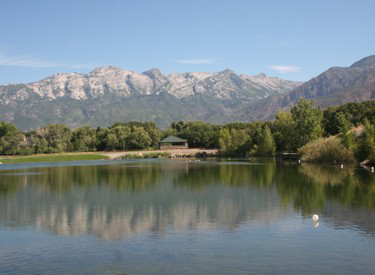

In [50]:
# Pictures of Murdock Canal Trail
murdock_pic1 = Image.open(requests.get('https://www.utahmountainbiking.com/trails/images/pics-trails/Murdock02.jpg', stream=True).raw)
murdock_pic2 = Image.open(requests.get('https://saltproject.co/sites/default/files/images/Lindon/MurdockTrail/Murdock%20Canal%2016.jpg', stream=True).raw)

murdock_pic1

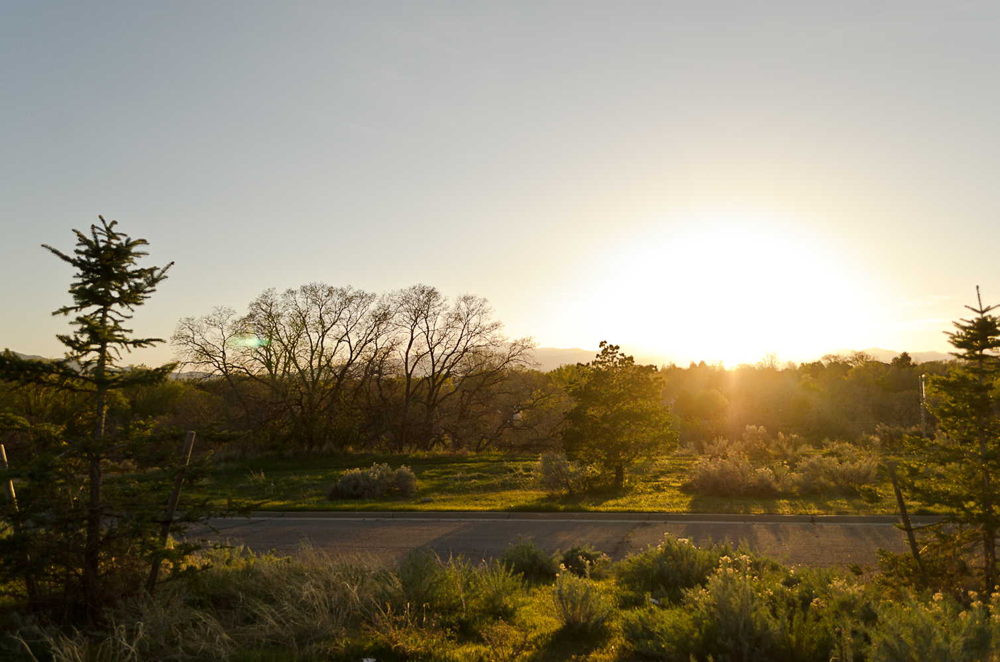

In [51]:
murdock_pic2

#### 4-3-c. Sensei Trail

Link to [Sensei Trail](https://www.trailforks.com/trails/sensei-trail/)

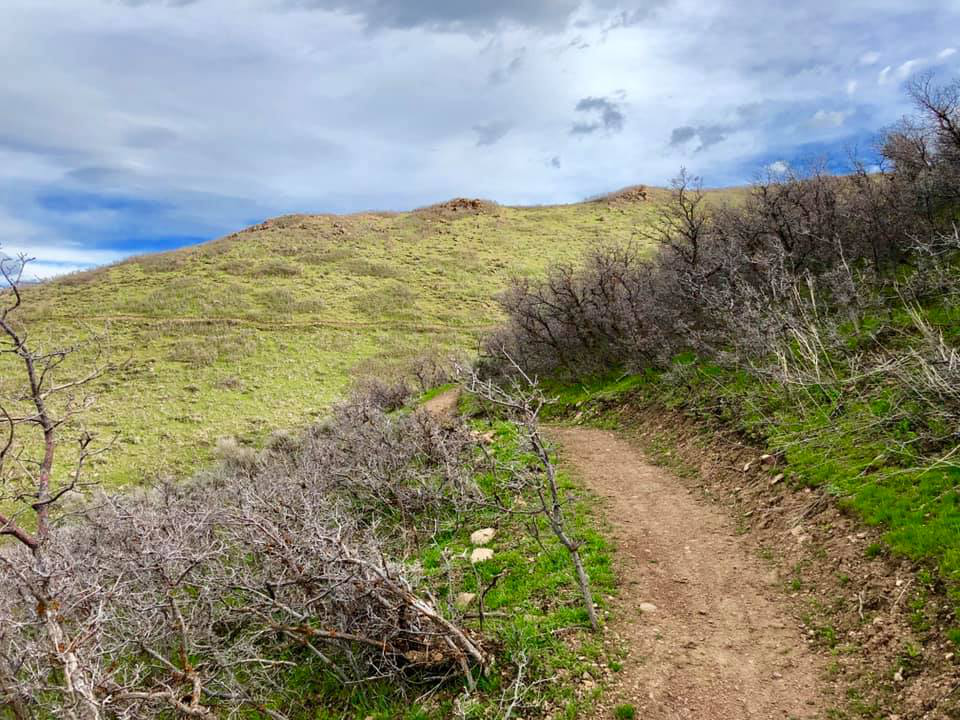

In [52]:
# Pictures of Sensei Trail
sensei_pic1 = Image.open(requests.get('https://www.lehi-ut.gov/wp-content/uploads/2019/05/Branden-Henline-Trail-photo.jpg', stream=True).raw)
sensei_pic1

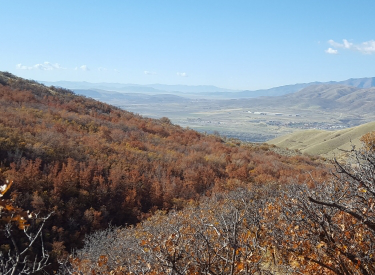

In [53]:
sensei_pic2 = Image.open(requests.get('http://www.utahmountainbiking.com/trails/images/pics-trails/TraverseMtn09.jpg', stream=True).raw)
sensei_pic2

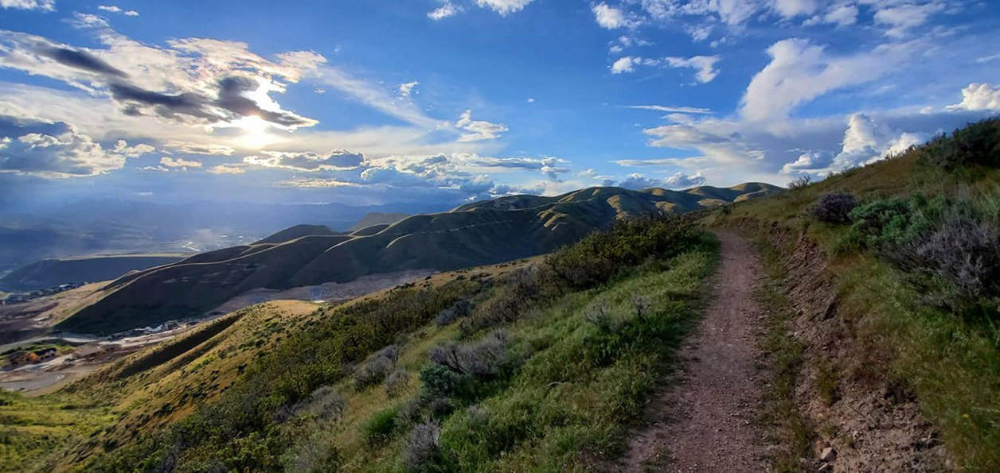

In [54]:
sensei_pic3 = Image.open(requests.get('https://i0.wp.com/www.lehifreepress.com/wp-content/uploads/2019/05/Sensei-Trail-Image-4-provided-by-TMTA-1.jpg?fit=1256%2C595&ssl=1', stream=True).raw)
sensei_pic3

#### 4-3-d. Dry Creek Trail Park

Link to [Dry Creek Trail Park](https://www.lehi-ut.gov/dry-creek-park/)

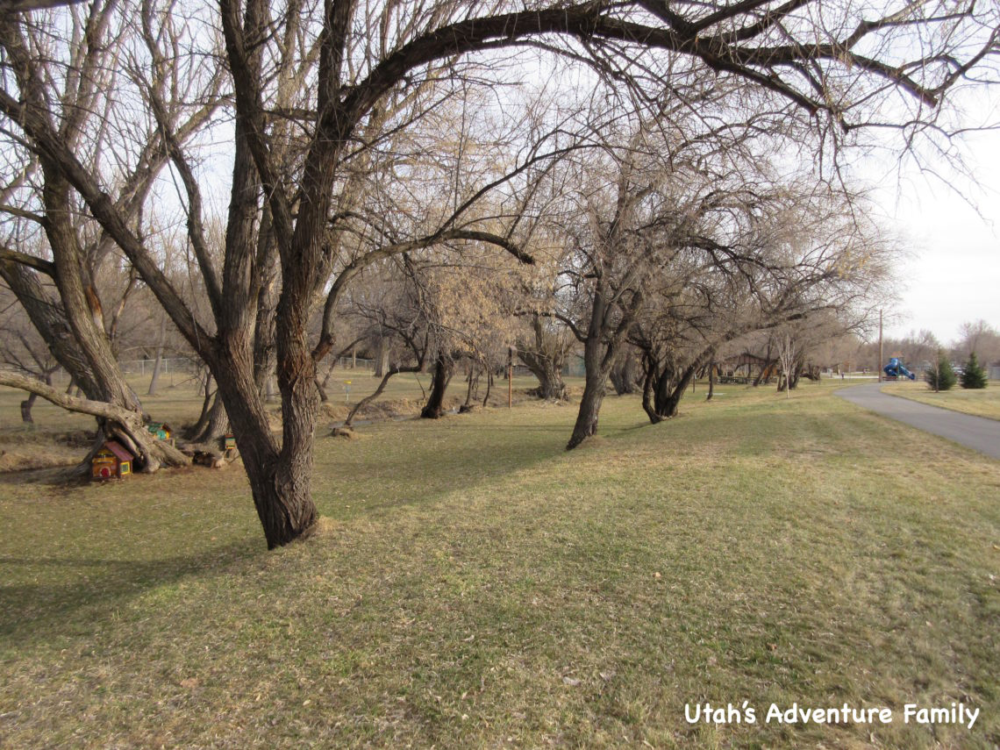

In [55]:
# Pictures of Dry Creek Trail Park
drycreek_pic1 = Image.open(requests.get('https://utahsadventurefamily.com/wp-content/uploads/2016/03/IMG_5211-1140x855.jpg', stream=True).raw)
drycreek_pic1

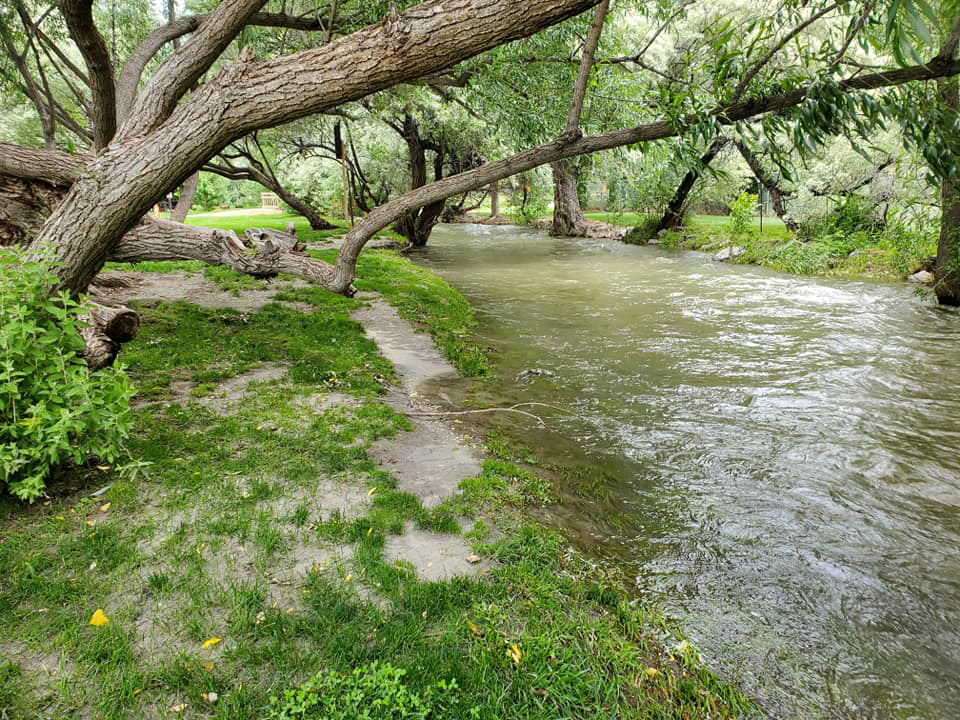

In [56]:
drycreek_pic2 = Image.open(requests.get('https://scontent-sjc3-1.xx.fbcdn.net/v/t1.0-9/64687247_2056413144484608_296335116878217216_n.jpg?_nc_cat=105&ccb=2&_nc_sid=8bfeb9&_nc_ohc=WUSyQCQp37kAX_hMFp_&_nc_ht=scontent-sjc3-1.xx&oh=b77008fc60c1059bf8ddfdcb8050bb2b&oe=5FC47C85', stream=True).raw)
drycreek_pic2

### Results
---
Based on the reseached data, I was able to create the map around the hotel and completed the planner the client may prefer.

#### 1. Map: 

In [57]:
venues_map = folium.Map(location=[latitude_hotel, longitude_hotel], zoom_start=15) 

# red circle represents the Hyatt Place.
folium.CircleMarker(
    [latitude_hotel, longitude_hotel],
    radius=10,
    color='red',
    popup='Hyatt Place',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(venues_map)


# green circles represent the trails.
for lat, lng, label in zip(dataframe_hiking_filtered.lat, dataframe_hiking_filtered.lng, dataframe_hiking_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='green',
        popup=label,
        fill = True,
        fill_color='green',
        fill_opacity=0.6
    ).add_to(venues_map)

# blue circles represent the restaurants.
for lat, lng, label in zip(dataframe_food_filtered.lat, dataframe_food_filtered.lng, dataframe_food_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)

# purple circles represent the shopping areas. 
for lat, lng, label in zip(dataframe_shopping_filtered.lat, dataframe_shopping_filtered.lng, dataframe_shopping_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='purple',
        popup=label,
        fill = True,
        fill_color='purple',
        fill_opacity=0.6
    ).add_to(venues_map)

    
# display map
venues_map

#### 2. Planner

In [58]:
option_planner = draft_planner
option_planner

,Day1,Day2,Day3
Morning,Arriving at Salt Lake City Airport and heading to the hotel,NaN,NaN
Evening,Participating IT conference,NaN,NaN
Night,Return to the hotel and find a restraunt for dinner,NaN,Heading to the airport


In [59]:
option_planner.loc[['Night'],['Day1']]= 'Return to the hotel and have a dinner at Tsunami Restaurant & Sushi Bar'
option_planner.loc[['Morning'],['Day2']]= 'Have a breakfast at The Original Pancake House and go for a walk at Murdock Canal Trail - Traverse Mountain'
option_planner.loc[['Evening'],['Day2']] = 'Visit Thanks Giving Point museum'
option_planner.loc[['Night'],['Day2']] = 'Have a dinner at Cafe Rio mexican restaurant and return to hotel'
option_planner.loc[['Morning'],['Day3']] = 'Have a breakfast at Harvest Restaurant'
option_planner.loc[['Evening'],['Day3']] = 'Go for a shopping at Outlets at Traverse Mountain'

In [60]:
option_planner

,Day1,Day2,Day3
Morning,Arriving at Salt Lake City Airport and heading to the hotel,Have a breakfast at The Original Pancake House and go for a walk at Murdock Canal Trail - Traverse Mountain,Have a breakfast at Harvest Restaurant
Evening,Participating IT conference,Visit Thanks Giving Point museum,Go for a shopping at Outlets at Traverse Mountain
Night,Return to the hotel and have a dinner at Tsunami Restaurant & Sushi Bar,Have a dinner at Cafe Rio mexican restaurant and return to hotel,Heading to the airport


#### 3. Weather
___
Like mentioned above, the temperture is expected comfortable autumn weather in Lehi, Utah. However, I am going to suggest to pack a winter jacket to the client because the temperture could get dropped as below as 34°F.

In [61]:
climate_oct

,"Climate data for Lehi, Utah"
,October
Average high °F (°C),64(18)
Average low °F (°C),34(1)
Average precipitation inches (mm),1.33(33.8)


### Discussion
---
When I started this project I was expecting to measure travel time but could not find exact timing due to limited resources on public transportation. Thus, the final plan did not reflect the travel time well, which may cause errors in real time planning.

### Conclusion
---

This project can provide guidlines for anyone who is planning to visit Lehi, Utah. Specially FourSquare provides useful information to explore various unvisited areas around Lehi. For example, it may give the distances between the places and reviews which can be helpful for a new visitor. However, despite FourSquare's usefullness, I experienced frustrtion gathering useful information. When trying to search various locations, I continued exceeding my daily limit which slowed down the research project. 

Generally speaking, this project taught me to use various tools for data science research in future. Through this project, I plan to establish my portfolio by using and getting used to various data science tools.